
Simulating network with p = 0


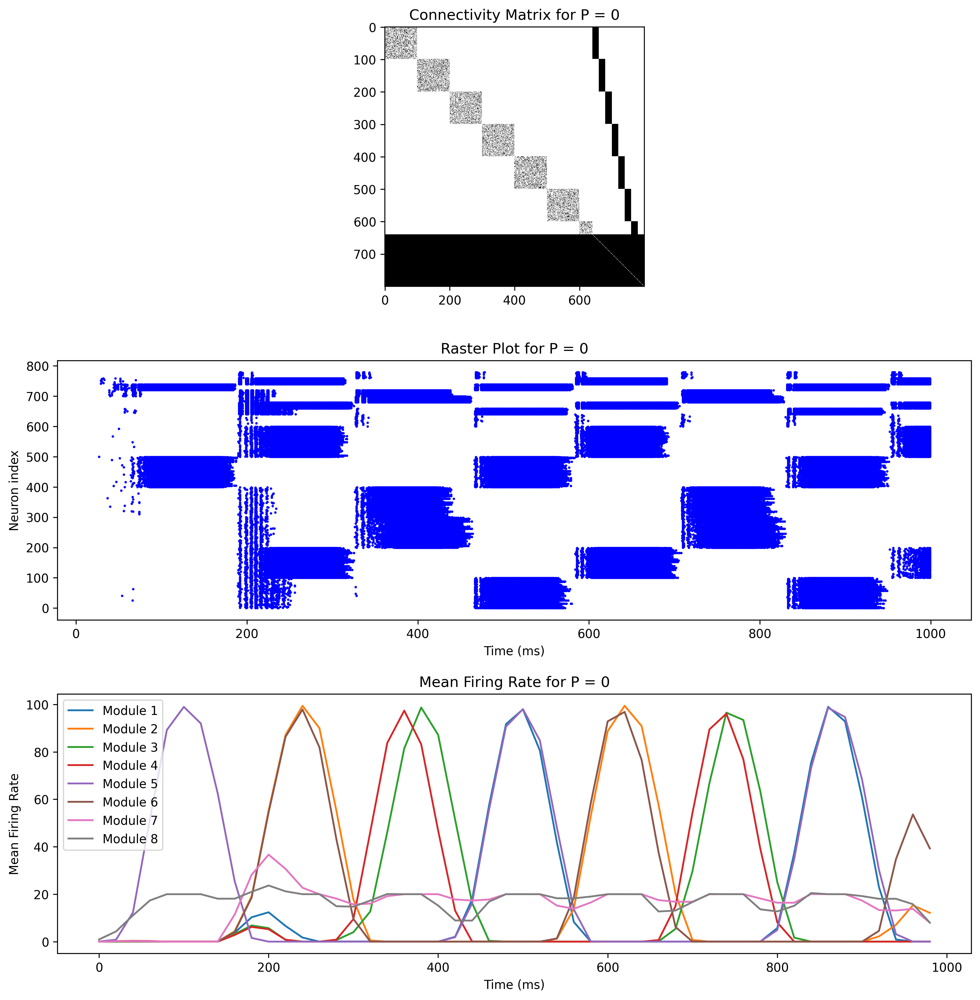


Simulating network with p = 0.1


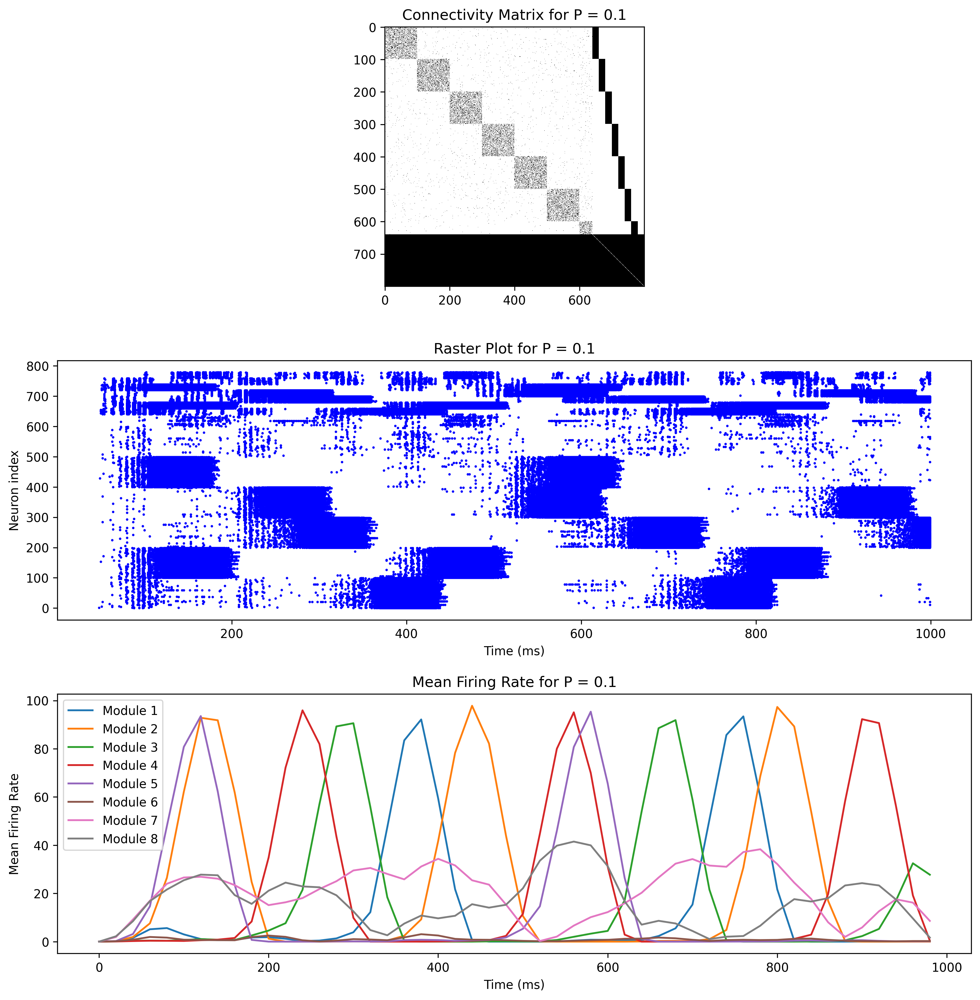


Simulating network with p = 0.2


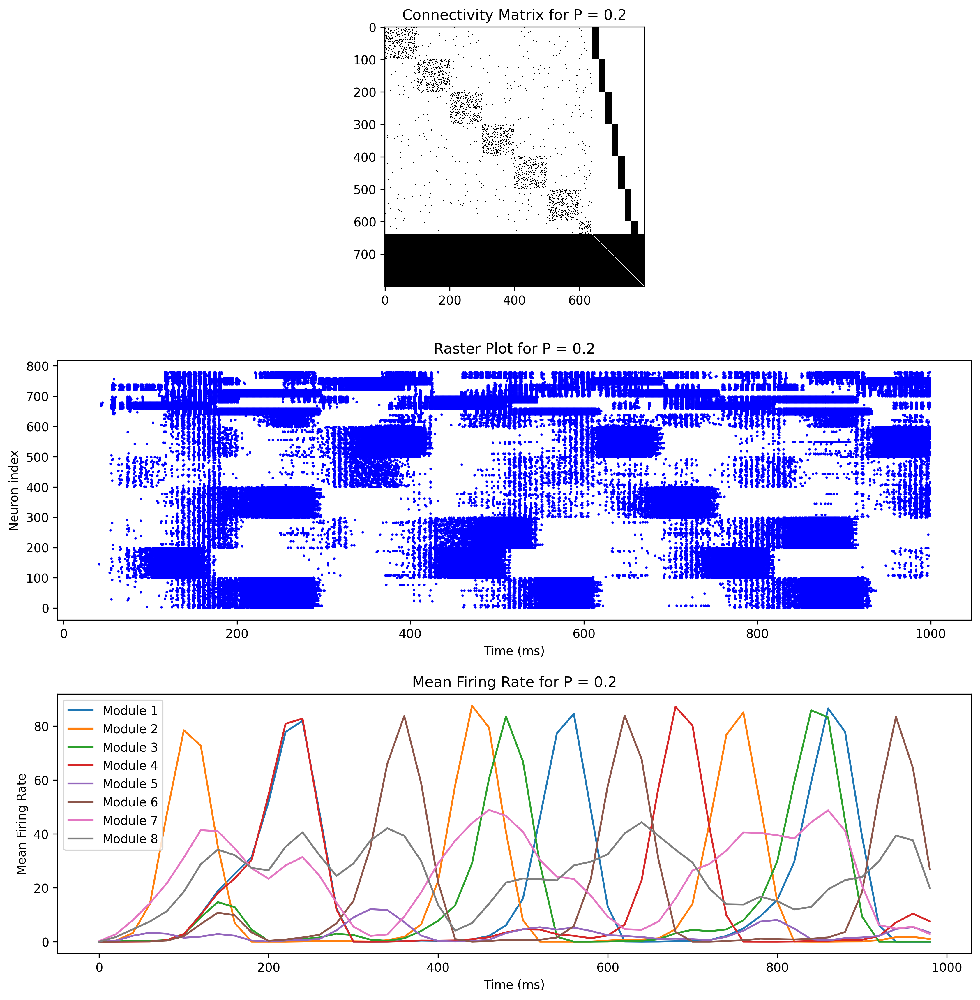


Simulating network with p = 0.3


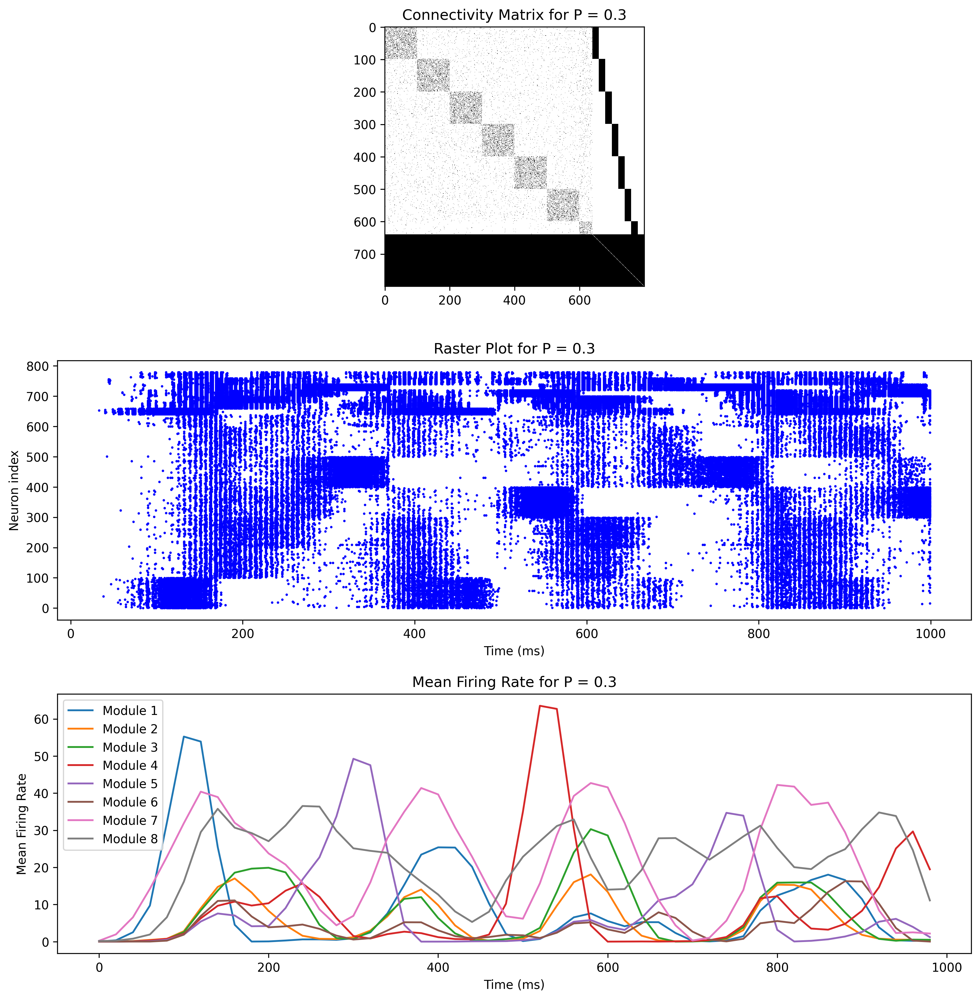


Simulating network with p = 0.4


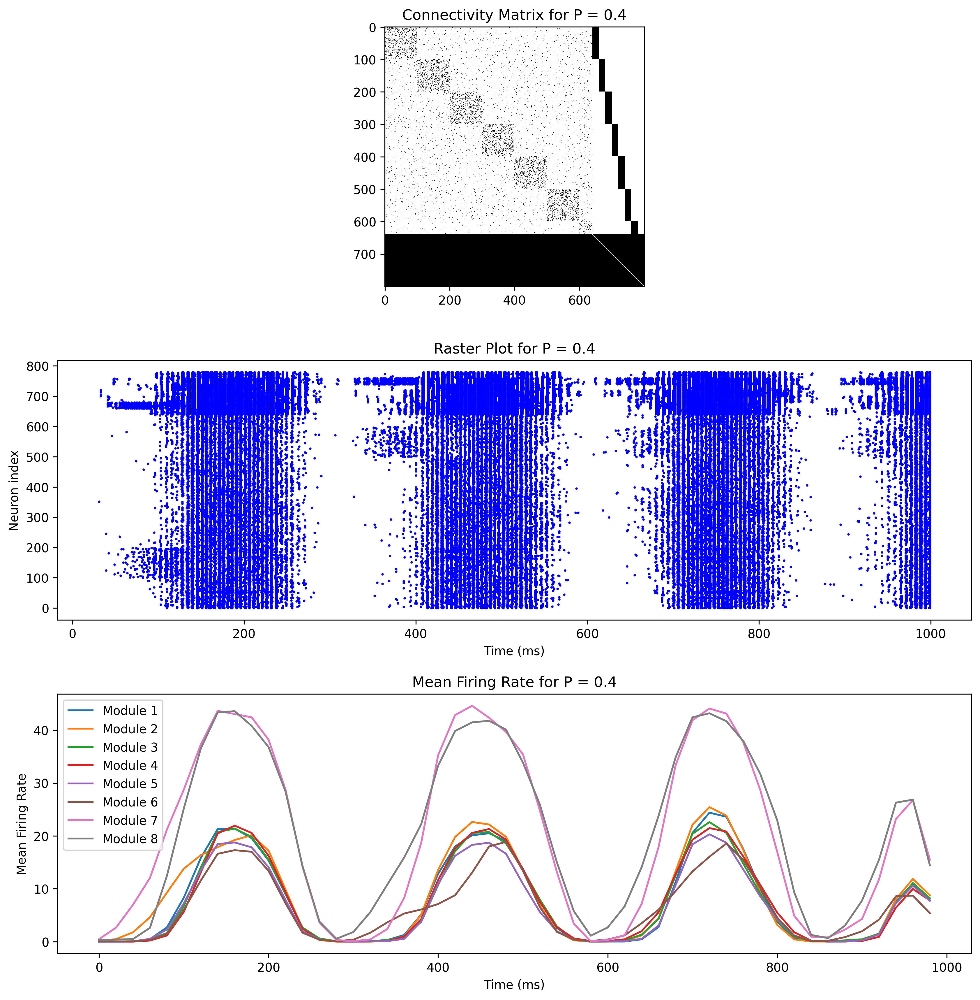


Simulating network with p = 0.5


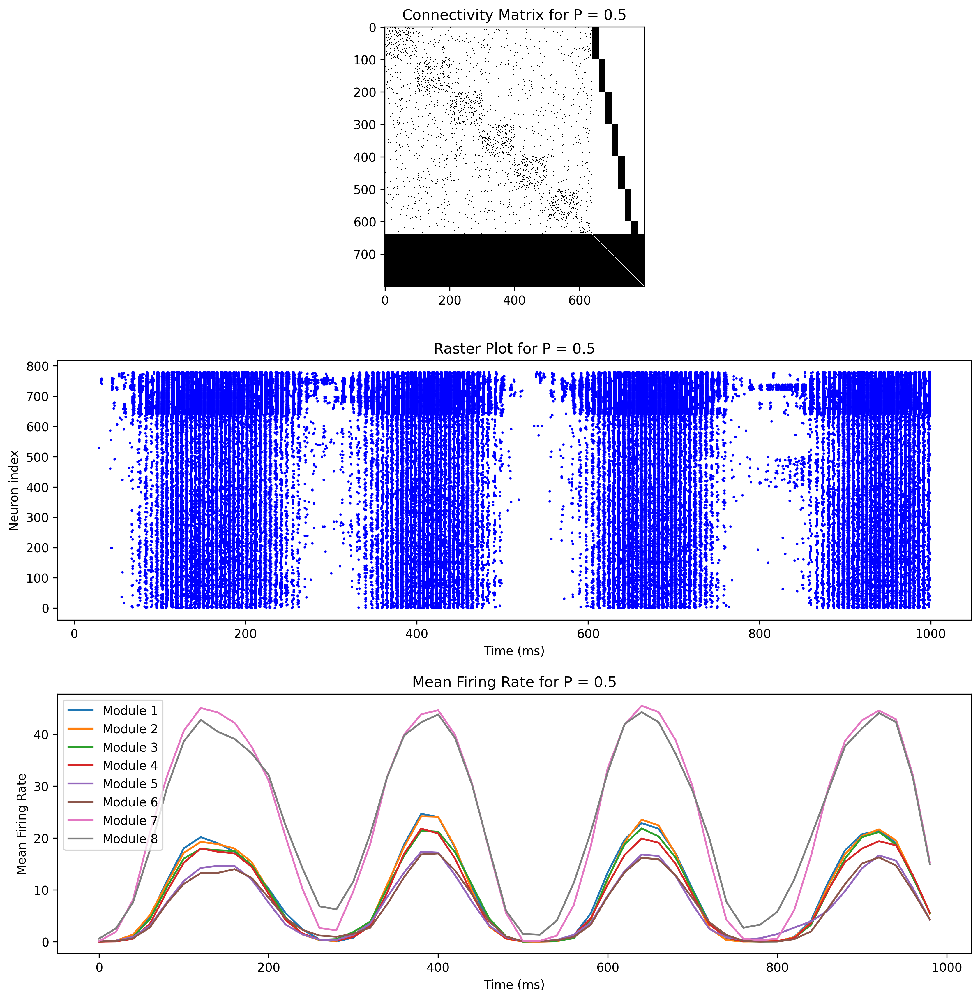


Simulating network with p = 0.7


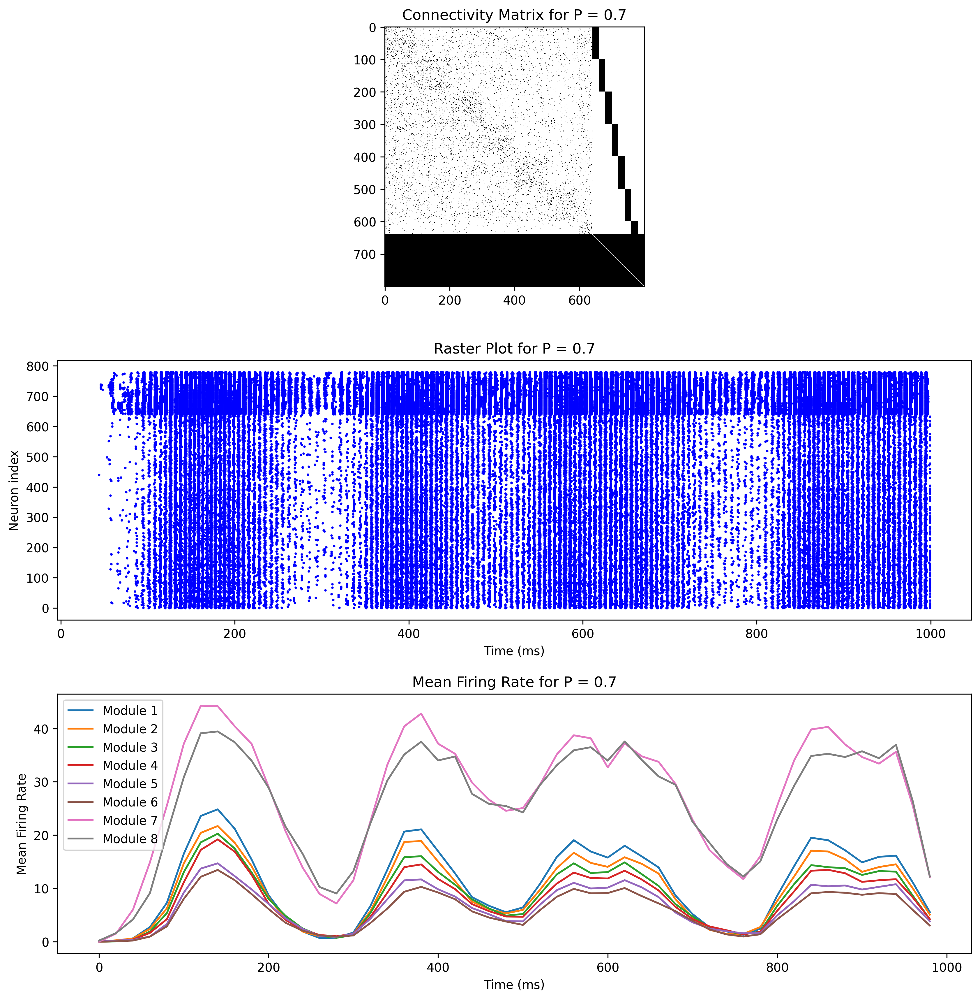

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from iznetwork import IzNetwork


def setup_neuron_parameters(N, excit_ratio=0.8):
    """Set up Izhikevich neuron parameters for excitatory and inhibitory populations"""
    N_excit = int(N * excit_ratio)
    N_inhib = N - N_excit
    rr_e = np.random.rand(N_excit)
    rr_i = np.random.rand(N_inhib)
    
    # Parameters for excitatory neurons (regular spiking)
    a_e = np.full(N_excit, 0.02)
    b_e = np.full(N_excit, 0.2)
    c_e = np.full(N_excit, -65 + 15 * (rr_e**2))
    d_e = np.full(N_excit, 8 - 6 * (rr_e**2))
    
    # Parameters for inhibitory neurons (fast spiking)
    a_i = np.full(N_inhib, 0.02 + 0.08 * rr_i)
    b_i = np.full(N_inhib, 0.02 + 0.08 * rr_i)
    c_i = np.full(N_inhib, -65)
    d_i = np.full(N_inhib, 2)
    
    # Combine parameters
    a = np.concatenate([a_e, a_i])
    b = np.concatenate([b_e, b_i])
    c = np.concatenate([c_e, c_i])
    d = np.concatenate([d_e, d_i])
    
    return a, b, c, d


def create_modular_network(N, num_modules, excit_ratio=0.8):
    """
    Create an initial modular network setup:
    - E->E: Spread of conduction delays (1-20ms), weight=17
    - E->I: Fixed delay (1ms), high scaling (50) for focal connections
    - I->E & I->I: Fixed delay (1ms), diffuse connections
    """
    neurons_per_module = N // num_modules
    N_excit = int(N * excit_ratio)
    N_inhib = N - N_excit
    inhib_per_module = N_inhib // num_modules
    
    # Initialize weight and delay matrices
    W = np.zeros((N, N))
    D = np.ones((N, N), dtype=int)  # Default 1ms delay for most connections
    
    # Create modular structure for excitatory neurons
    for m in range(num_modules):
        start_idx = m * neurons_per_module
        end_idx = min((m + 1) * neurons_per_module, N_excit)
        
        # Within-module connectivity (E->E)
        for i in range(start_idx, end_idx):
            for j in range(start_idx, end_idx):
                if i != j and np.random.rand() < 0.28:  
                    W[i, j] = 17  # E->E weight
                    # Spread of conduction delays for E->E connections
                    D[i, j] = np.random.choice(list(range(1, 21)))  # Random delay between 1-20ms
    
    # E->I connections (focal from module, high scaling to compensate for fewer connections)
    for i in range(N_excit):
        module = i // neurons_per_module
        module_inhib_start = N_excit + (module * inhib_per_module)
        module_inhib_end = N_excit + ((module + 1) * inhib_per_module)
        
        for j in range(module_inhib_start, module_inhib_end):
            W[i, j] = 50 * np.random.uniform(0, 1)  # High scaling (50) for E->I
            D[i, j] = 1  # Fixed 1ms delay

    # I->E and I->I connections (diffuse with fixed delay)
    for i in range(N_excit, N):
        # Inhibitory to excitatory
        for j in range(N_excit):
            W[i, j] = 2 * np.random.uniform(-1, 0)
            D[i, j] = 1  # Fixed 1ms delay
    
        # Inhibitory to inhibitory
        for j in range(N_excit, N):
            if i != j:
                W[i, j] = np.random.uniform(-1, 0)
                D[i, j] = 1  # Fixed 1ms delay

    return W, D

def rewire_connections(W, D, num_modules, p_rewire, N_excit, neurons_per_module):
    """Rewire intra-community edges with probability p_rewire."""
    for i in range(N_excit):
        module = i // neurons_per_module
        for j in range(N_excit):
            # Check for an existing intra-community connection
            if W[i, j] != 0 and np.random.rand() < p_rewire:
                # Store original connection properties
                orig_weight = W[i, j]
                orig_delay = D[i, j]
                
                # Remove original connection
                W[i, j] = 0
                D[i, j] = 1
                
                # Rewire to a different module
                target_module = np.random.choice([m for m in range(num_modules) if m != module])
                target_start = target_module * neurons_per_module
                target_end = min((target_module + 1) * neurons_per_module, N_excit)
                target_start = min(target_start, target_end)
                target_end = max(target_start, target_end)
                if target_end == target_start:
                    target_start = 0
                    target_end = N_excit
                    
                # Select a new target within the target module
                new_target = np.random.randint(target_start, target_end)
                
                # Apply new connection
                W[i, new_target] = orig_weight
                D[i, new_target] = orig_delay

def simulate_network(p_rewire):
    """Run simulation for a given rewiring probability."""
    N = 800  # Total neurons
    num_modules = 8
    T = 1000  # Simulation time (ms)
    
    # Initial network setup
    W, D = create_modular_network(N, num_modules)
    neurons_per_module = N // num_modules
    N_excit = int(N * 0.8)
    
    # Rewiring process
    rewire_connections(W, D, num_modules, p_rewire, N_excit, neurons_per_module)
    
    # Initialize network
    net = IzNetwork(N, 20)  # Max delay of 20ms
    a, b, c, d = setup_neuron_parameters(N)
    net.setParameters(a, b, c, d)
    net.setWeights(W)
    net.setDelays(D)
    
    # Run simulation
    spikes = []
    V = np.zeros((T, N))
    
    # Background firing properties
    base_current = np.tile(np.random.uniform(4, 6, num_modules), N // num_modules)
    current = np.zeros((T, N))
    poisson_lambda = 0.01
    poisson_current = 15
    
    for t in range(T):
        poisson_events = np.random.poisson(poisson_lambda, N)
        current[t, poisson_events > 0] = poisson_current
        I = base_current + current[t]
        net.setCurrent(I)
        fired = net.update()
        V[t, :] = net.getState()[0]
    
    # Plot results
    fig, axs = plt.subplots(3, 1, figsize=(12, 12), dpi=300)
    fig.tight_layout(pad=4.0)

    # Plot connectivity matrix as a binary image
    W_binary = (W != 0).astype(int)
    axs[0].imshow(W_binary, cmap='Greys', interpolation='nearest')
    axs[0].set_title(f'Connectivity Matrix for P = {p_rewire}')


    # Plot raster plot
    V_e = V[:, :N]  # Extract excitatory neurons
    t, n = np.where(V_e > 29)  # Firing threshold
    axs[1].scatter(t, n, color='blue', s=1)
    axs[1].set_title(f'Raster Plot for P = {p_rewire}')
    axs[1].set_xlabel('Time (ms)')
    axs[1].set_ylabel('Neuron index')

    # Plot mean firing rate per module
    window_size = 50
    shift_size = 20
    for i in range(num_modules):
        module_V = V[:, i * 100:(i + 1) * 100]
        firing_rate = []
        
        for start in range(0, T, shift_size):
            end = start + window_size
            module_tmp = module_V[start:end] if end < T else module_V[start:T]
            num_spikes = np.sum(module_tmp > 29)
            rate = num_spikes / (end - start)
            firing_rate.append(rate)
        
        axs[2].plot(np.arange(0, T, shift_size), firing_rate, label=f'Module {i + 1}')
    
    axs[2].set_title(f'Mean Firing Rate for P = {p_rewire}')
    axs[2].set_xlabel('Time (ms)')
    axs[2].set_ylabel('Mean Firing Rate')
    axs[2].legend()

    plt.show()
    return spikes, W, V

# Run simulations for different p values
p_values = [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.7]
for p in p_values:
    print(f"\nSimulating network with p = {p}")
    simulate_network(p)
